<a href="https://colab.research.google.com/github/Camilojaravila/202310_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/blob/main/Laboratorio%201/Taller%201.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

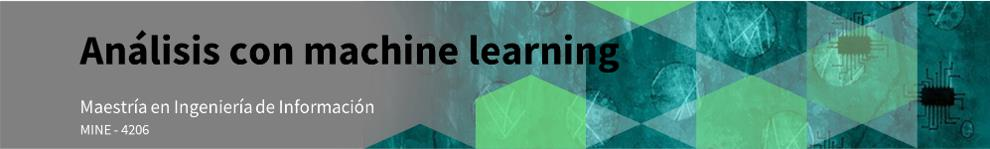

- **Integrante 1:** Juan Diego Sánchez
- **Integrante 2:** Camilo Rozo
- **Integrante 3:** Alberto Mendoza


En la actualidad, el sector inmobiliario está en pleno auge. Ofrece muchas oportunidades emocionantes y un alto rendimiento en cuanto a estilos de vida e inversiones. El mercado inmobiliario lleva varios años en fase de crecimiento, lo que significa que todavía se pueden encontrar propiedades a precios muy atractivos, pero es muy probable que aumenten en el futuro.
Para poder entender el mercado, una inmobiliaria rusa le ha brindado la información de la venta de más de 28 mil inmuebles entre los años de 2018 y 2021. Y quieren entender cuáles son las características principales que inciden en los precios de venta, para poder proponer planes de construcción de inmuebles en las áreas urbanas disponibles, que tomen en cuenta estas características.

Para poder tomar decisiones en este estudio, se debe presentar:

* Una tabla comparativa, mostrando el rendimiento los tres mejores modelos entrenados con regresión polinomial, ridge y lasso.

* Un análisis de las variables que se consideraron importantes en la predicción con base en el modelo lasso.

* A partir de la tabla comparativa, ¿cuál modelo ofrece el mejor rendimiento sobre el conjunto test? ¿Qué interpretación puedes darles a los valores obtenidos sobre las métricas de rendimiento?

* ¿Cuáles variables fueron seleccionadas con el modelo Lasso? A partir de estas, ¿qué interpretación de cara al problema puedes dar? Reflexiona sobre cómo este nuevo conocimiento podría ayudar a tomar decisiones en el contexto del problema.

**Datos**: AirbnbRJRentals.csv

## Diccionario de Datos

La inmobiliaria, le ha construido el siguiente diccionario de datos:

**id**: Airbnb's unique identifier for the listing.

**name**: Name of the listing.

**host_id**: Airbnb's unique identifier for the host/user.

**host_name**: Name of the host. Usually just the first name(s).

**neighbourhood**: neighbourhood.

**latitude**: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

**longitude**: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

**room_type**: "[Entire home/apt|Private room|Shared room|Hotel] All homes are grouped into the following three room types: Entire place Private room Shared room Entire place Entire places are best if you're seeking a home away from home. With an entire place, you'll have the whole space to yourself. This usually includes a bedroom, a bathroom, a kitchen, and a separate, dedicated entrance. Hosts should note in the description if they'll be on the property or not (ex: ""Host occupies first floor of the home""), and provide further details on the listing. Private rooms Private rooms are great for when you prefer a little privacy, and still value a local connection. When you book a private room, you'll have your own private room for sleeping and may share some spaces with others. You might need to walk through indoor spaces that another host or guest may occupy to get to your room. Shared rooms Shared rooms are for when you don't mind sharing a space with others. When you book a shared room, you'll be sleeping in a space that is shared with others and share the entire space with other people. Shared rooms are popular among flexible travelers looking for new friends and budget-friendly stays."

**price**: daily price in local currency

**minimum_nights**: minimum number of night stay for the listing (calendar rules may be 
different)

**number_of_reviews**: The number of reviews the listing has

**last_review**: The date of the last/newest review

**reviews_per_month**: The number of reviews the listing has over the lifetime of the listing

**calculated_host_listings_count**: The number of listings the host has in the current scrape, in the city/region geography.

**availability_365**: avaliability_x. The availability of the listing x days in the future as determined by the calendar. Note a listing may not be available because it has been booked by a guest or blocked by the host.

**number_of_reviews_ltm**: The number of reviews the listing has (in the last 12 months)

In [76]:
%pip install ydata-profiling geopandas pandas numpy matplotlib seaborn scikit-learn -q

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Importar librerías

In [99]:
#Entrenamiento del modelo
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV, HalvingGridSearchCV

# Analisis profundo de datos
from ydata_profiling import ProfileReport

# Manejo de datos
import pandas as pd
import geopandas as gpd
import numpy as np
import datetime

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown, clear_output

%matplotlib inline


### Cargar datos inmobiliarios

In [78]:
data = pd.read_csv('./AirbnbRJRentals.csv')
data.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,10463735,Sobrado aconchegante e espaçoso,53918534,Quiá,Laranjeiras,-22.93555,-43.191070,Entire home/apt,581,1,2,2018-02-14,0.03,6,181,0
1,53887789,Quadra da praia,333527901,Lucas,Copacabana,-22.97032,-43.180810,Entire home/apt,898,5,0,NaN,NaN,2,365,0
2,783493769216852616,"Leme, Brasil",491704706,Felipe,Leme,-22.96421,-43.171600,Entire home/apt,720,1,0,NaN,NaN,2,362,0
3,703973293620197060,Suíte com entrada independente em casarão 1,20362236,Júlio Cesar,Botafogo,-22.95792,-43.182226,Private room,599,4,1,2022-09-06,0.26,4,363,1
4,782895997622988215,Apartamento próximo ao metrô,302417043,Laís,Laranjeiras,-22.93196,-43.180180,Entire home/apt,240,3,0,NaN,NaN,1,160,0


In [79]:
rio_de_janeiro = gpd.read_file('./barrios_rio.geojson')
rio_de_janeiro.drop("Name", axis=1, inplace=True)
rio_de_janeiro.drop("description", axis=1, inplace=True)
rio_de_janeiro.head(3)

,OBJECTID,Área,NOME,REGIAO_ADM,AREA_PLANE,CODBAIRRO,CODRA,CODBNUM,LINK,SHAPESTArea,SHAPESTLength,RP,Cod_RP,CODBAIRRO_LONG,geometry
0,425,3.638176e+05,Saúde,PORTUARIA,1,1,1,1.0,Saúde &area=1,3.638176e+05,2646.216986,Centro,1.1,1,"POLYGON ((-43.18111 -22.89542, -43.18115 -22.8..."
1,420,1.112903e+06,Gamboa,PORTUARIA,1,2,1,2.0,Gamboa &area=2,1.112903e+06,4612.827414,Centro,1.1,2,"POLYGON ((-43.18787 -22.89311, -43.19065 -22.8..."
2,421,1.684721e+06,Santo Cristo,PORTUARIA,1,3,1,3.0,Santo Cristo &area=3,1.684721e+06,6743.218804,Centro,1.1,3,"POLYGON ((-43.19446 -22.90337, -43.19455 -22.9..."


### Dividir conjunto de datos

 - Proporción 80:20

In [80]:
train_m, test = train_test_split(data, test_size=0.2, random_state=4206)
train_m.head(3)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
14295,29876334,Venha garantir seu reveillon e curtir o verão.,120966678,Aline Cristina Da Silva Soares,Copacabana,-22.97320,-43.19037,Entire home/apt,855,1,0,NaN,NaN,1,364,0
7330,16519009,Spacious and comfortable 4 bedrooms apartment ...,74463624,Mozart,Copacabana,-22.96488,-43.17430,Entire home/apt,10350,3,56,2022-12-19,0.77,75,27,11
21630,18595795,Modern Studio Apartment Near Lapa,26420871,Daniel,Santa Teresa,-22.91362,-43.19173,Entire home/apt,145,3,135,2022-12-22,2.13,1,28,12


In [81]:
train, y_train = train_m.drop(
    ['price'], axis=1), train_m['price']

display(train.head(3))
display(y_train.head(3))


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
14295,29876334,Venha garantir seu reveillon e curtir o verão.,120966678,Aline Cristina Da Silva Soares,Copacabana,-22.97320,-43.19037,Entire home/apt,1,0,NaN,NaN,1,364,0
7330,16519009,Spacious and comfortable 4 bedrooms apartment ...,74463624,Mozart,Copacabana,-22.96488,-43.17430,Entire home/apt,3,56,2022-12-19,0.77,75,27,11
21630,18595795,Modern Studio Apartment Near Lapa,26420871,Daniel,Santa Teresa,-22.91362,-43.19173,Entire home/apt,3,135,2022-12-22,2.13,1,28,12


14295      855
7330     10350
21630      145
Name: price, dtype: int64

### Perfilamiento

In [82]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [83]:
numeric_features = data.dtypes[data.dtypes != "object"]
categorical_features = data.dtypes[data.dtypes == "object"]
categorical_features


name             object
host_name        object
neighbourhood    object
room_type        object
last_review      object
dtype: object

In [85]:
bounding_box = (data.latitude.min(), data.longitude.min(), data.latitude.max(), data.longitude.max())
bounding_box

(-23.07284, -43.7059101, -22.74969, -43.1044)

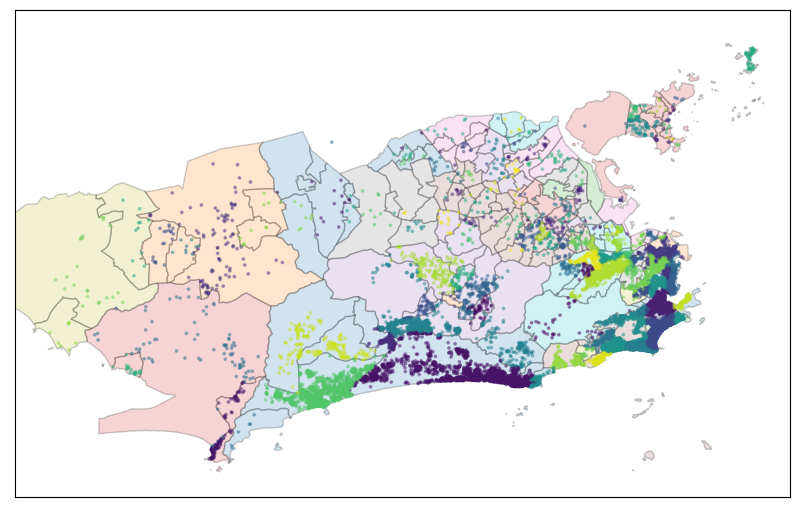

In [86]:
# plot points over map

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlim(bounding_box[1]-0.03, bounding_box[3]+0.03)
ax.set_ylim(bounding_box[0]-0.03, bounding_box[2]+0.03)
# plt.axis("off")
ax.set_xticks([])
ax.set_yticks([])
rio_de_janeiro.plot(ax=ax, alpha=0.2,  edgecolor='black',
         column="REGIAO_ADM").set_facecolor('white')
airbnbs = ax.scatter(data['longitude'], data['latitude'], c=data.neighbourhood.astype('category').cat.codes,
           alpha=0.4, s=3)

plt.show()


In [87]:

pricing_apt = data[data["room_type"] == "Entire home/apt"]["price"]
pricing_priv = data[data["room_type"] == "Private room"]["price"]
pricing_shared = data[data["room_type"] == "Shared room"]["price"]
pricing_hotel = data[data["room_type"] == "Hotel room"]["price"]

apt_stats =pricing_apt.describe()
priv_stats = pricing_priv.describe()
shared_stats = pricing_shared.describe()
hotel_stats = pricing_hotel.describe()
mdstring = "## Estadisticas de precios por tipo de habitación\n\n|Alojamiento|count|mean|  std|  min|  25%|  50%|  75%|  max|\n|---|---|---|---|---|---|---|---|---|\n"
mdstring += f"|Apartamento|{apt_stats['count']}|{apt_stats['mean']}|{apt_stats['std']}|{apt_stats['min']}|{apt_stats['25%']}|{apt_stats['50%']}|{apt_stats['75%']}|{apt_stats['max']}|\n"
mdstring += f"|Habitación privada|{priv_stats['count']}|{priv_stats['mean']}|{priv_stats['std']}|{priv_stats['min']}|{priv_stats['25%']}|{priv_stats['50%']}|{priv_stats['75%']}|{priv_stats['max']}|\n"
mdstring += f"|Habitación compartida|{shared_stats['count']}|{shared_stats['mean']}|{shared_stats['std']}|{shared_stats['min']}|{shared_stats['25%']}|{shared_stats['50%']}|{shared_stats['75%']}|{shared_stats['max']}|\n"
mdstring += f"|Hotel|{hotel_stats['count']}|{hotel_stats['mean']}|{hotel_stats['std']}|{hotel_stats['min']}|{hotel_stats['25%']}|{hotel_stats['50%']}|{hotel_stats['75%']}|{hotel_stats['max']}|\n"

mdstring += "\n\n No hay una relación de orden por precio aparente"
display(Markdown(mdstring))


## Estadisticas de precios por tipo de habitación

|Alojamiento|count|mean|  std|  min|  25%|  50%|  75%|  max|
|---|---|---|---|---|---|---|---|---|
|Apartamento|22093.0|1605.6727470239443|9158.57604761225|50.0|414.0|717.0|1229.0|500000.0|
|Habitación privada|5685.0|774.1060686015832|8273.097361212853|33.0|161.0|287.0|500.0|500000.0|
|Habitación compartida|470.0|2211.423404255319|28451.186041534835|35.0|109.0|182.0|300.0|604981.0|
|Hotel|53.0|1475.8301886792453|2632.3002571299694|0.0|267.0|673.0|1014.0|9999.0|


 No hay una relación de orden por precio aparente

In [88]:
rio_de_janeiro["REGIAO_ADM"].describe()

count       162
unique       33
top       MEIER
freq         16
Name: REGIAO_ADM, dtype: object

### Observaciones relevantes

 - neighbourhood tiene alta cardinalidad
 - room_type está desbalanceada hacia Entire home/apt
 - last_review tiene fechas vacías
 - reviews_per_month tiene valores vacíos
 - minimum_nights está sesgada

### Decisiones a partir del perfilamiento

1. Transformaciones

|   Variable    | Cambio           | Razón                                                                                                                                                       |
| :-----------: | :--------------- | :---------------------------------------------------------------------------------------------------------------------------------------------------------- |
|   id, name, host_name, host_id    | Eliminar         | Identificadores sin relación al precio                                                                                                                      |
|   room_type   | One Hot encoding | No hay relación de orden aparente entre los valores y no aumenta demasiado la complejidad (4 variables adicionales)                                         |
| neighbourhood | Agrupar          | Agrupar con datos regionales "region", One-Hot encoding agregaría demasiadas variables                                                                      |
|    region     | One Hot encoding | No hay relación de orden, menos variables que con neighbourhood. Podría aumentar la complejidad del modelo de forma considerable (33 variables adicionales) |
|  last_review  | Cuantificar      | Transformar a "días desde última review"                                                                                                                    |


2. Nulos y valores vacíos

|     Variable      | Tratamiento               | Razón                                                                               |
| :---------------: | :------------------------ | :---------------------------------------------------------------------------------- |
|    last_review    | Rellenar con el Unix time | Se presume que no tener reseñas es similar a tener reseñas extremadamente antiguas. |
| reviews_per_month | Rellenar con ceros        | Ser vacía coincide con no tener reseñas, luego, 0 reseñas mensuales tiene sentido   |

3. Sesgos y desbalance

|    Variable    |  Problema  | Ideas                                                  |
| :------------: | :--------: | :----------------------------------------------------- |
|   room_type    | Desbalance | no hacer nada, undersampling, oversampling del resto,                 |
|     price      |   Sesgo    | no hacer nada, escalamiento robusto, log, sqrt, boxcox |
| minimum_nights |   Sesgo    | no hacer nada, escalamiento robusto, log, sqrt, boxcox |


A partir de [Guia de transforms custom](https://towardsdatascience.com/clean-efficient-data-pipelines-with-pythons-sklearn-2472de04c0ea)

In [94]:
from sklearn.base import BaseEstimator, TransformerMixin


class CustomTransformApplier(BaseEstimator, TransformerMixin):

    rio_de_janeiro = None
    today = None
    unneeded_variables = None

    def __init__(self, uneeded_variables: list[str] = ["id", "name", "host_name","host_id"], rio_de_janeiro:pd.DataFrame = rio_de_janeiro, today:pd.Timestamp = pd.to_datetime("today").normalize()):
        self.uneeded_variables = uneeded_variables
        self.rio_de_janeiro = rio_de_janeiro
        self.today = today
    

    def _date_transformation(self, field):
        return (self.today-field).days
    
    def _neighbourhood_grouping(self,field):
        return self.rio_de_janeiro.loc[self.rio_de_janeiro["NOME"] == field]["REGIAO_ADM"].str.capitalize().values[0]

    def fit(self, X,y=None):
        return self

    def transform(self, training_dframe:pd.DataFrame):
        transformed_training_dframe = training_dframe.copy()
        transformed_training_dframe.drop(self.uneeded_variables, axis=1, inplace=True)
        transformed_training_dframe["region"] = transformed_training_dframe["neighbourhood"].apply(self._neighbourhood_grouping)
        transformed_training_dframe.drop("neighbourhood", axis=1, inplace=True)
        transformed_training_dframe["last_review"] = pd.to_datetime(transformed_training_dframe["last_review"])
        transformed_training_dframe["last_review"].replace(np.nan, pd.to_datetime(0), inplace=True)
        transformed_training_dframe["reviews_per_month"].fillna(0, inplace=True)
        transformed_training_dframe["last_review"] = transformed_training_dframe["last_review"].apply(self._date_transformation)
        
        return transformed_training_dframe


In [90]:
# somedataframetest = CustomTransformApplier().transform(train)
numeric_features = data.dtypes[data.dtypes != "object"] 

In [95]:
from sklearn.compose import ColumnTransformer, make_column_selector

onehot_variables = ["room_type", "region"]

variable_transforming = ColumnTransformer([
    ('numerical', StandardScaler(), make_column_selector(dtype_include=np.number)),
    ('categorical', OneHotEncoder(sparse_output=False), onehot_variables),
], remainder='passthrough')


In [96]:

training_base_pipeline = Pipeline(
    steps=[
        ('custom_transform', CustomTransformApplier(uneeded_variables=["id","name","host_name"],rio_de_janeiro=rio_de_janeiro)),
        ('variable_transforming', variable_transforming)
    ]
)

In [97]:
training_base_pipeline.fit(train)

Pipeline(steps=[('custom_transform',
                 CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.960855e+06  Complexo do Alemão  COMPLEX...
161  POLYGON ((-43.48750 -22.86233, -43.48744 -22.8...  

[162 rows x 15 columns],
                                        uneeded_variables=['id', 'name',
                                                           'host_name'])),
                ('variable_transforming',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000021E2946BB20>),
                                                 ('categorical',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['room_type', 'region'])]))])

In [ ]:
onehots_names=training_base_pipeline['variable_transforming'].transformers_[
    1][1].get_feature_names_out()

onehots_names


array(['room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room',
       'region_Anchieta', 'region_Bangu', 'region_Barra da tijuca',
       'region_Botafogo', 'region_Campo grande', 'region_Centro',
       'region_Cidade de deus', 'region_Complexo do alemão',
       'region_Copacabana', 'region_Guaratiba',
       'region_Ilha do governador', 'region_Inhauma', 'region_Iraja',
       'region_Jacarepagua', 'region_Lagoa', 'region_Madureira',
       'region_Meier', 'region_Paqueta', 'region_Pavuna', 'region_Penha',
       'region_Portuaria', 'region_Ramos', 'region_Realengo',
       'region_Rio comprido', 'region_Rocinha', 'region_Santa cruz',
       'region_Santa tereza', 'region_Sao cristovao', 'region_Tijuca',
       'region_Vigario geral', 'region_Vila isabel'], dtype=object)

In [ ]:
num_names = training_base_pipeline['variable_transforming'].transformers_[
    0][1].feature_names_in_

num_names


array(['host_id', 'latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'], dtype=object)

In [ ]:

col_names = list(num_names) + list(onehots_names)
col_names

['host_id',
 'latitude',
 'longitude',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'number_of_reviews_ltm',
 'room_type_Entire home/apt',
 'room_type_Hotel room',
 'room_type_Private room',
 'room_type_Shared room',
 'region_Anchieta',
 'region_Bangu',
 'region_Barra da tijuca',
 'region_Botafogo',
 'region_Campo grande',
 'region_Centro',
 'region_Cidade de deus',
 'region_Complexo do alemão',
 'region_Copacabana',
 'region_Guaratiba',
 'region_Ilha do governador',
 'region_Inhauma',
 'region_Iraja',
 'region_Jacarepagua',
 'region_Lagoa',
 'region_Madureira',
 'region_Meier',
 'region_Paqueta',
 'region_Pavuna',
 'region_Penha',
 'region_Portuaria',
 'region_Ramos',
 'region_Realengo',
 'region_Rio comprido',
 'region_Rocinha',
 'region_Santa cruz',
 'region_Santa tereza',
 'region_Sao cristovao',
 'region_Tijuca',
 'region_Vigario geral',
 'region_Vila isabel']

In [ ]:
transformed_nparray = training_base_pipeline.fit_transform(train)

In [ ]:
transformed_nparray

array([[-0.15906926, -0.1602241 ,  0.60704408, ...,  0.        ,
         0.        ,  0.        ],
       [-0.46360258,  0.07636182,  0.76775423, ...,  0.        ,
         0.        ,  0.        ],
       [-0.77821889,  1.53398138,  0.59344322, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 2.16937028, -0.99623688, -1.42508423, ...,  0.        ,
         0.        ,  0.        ],
       [ 2.11365444,  0.95360652,  0.74785297, ...,  0.        ,
         0.        ,  0.        ],
       [-0.54306552, -0.18325711, -1.30487664, ...,  0.        ,
         0.        ,  0.        ]])

In [ ]:
transformed_dataframe = pd.DataFrame(transformed_nparray, columns=col_names, index=train.index)

transformed_dataframe

,host_id,latitude,longitude,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,...,region_Ramos,region_Realengo,region_Rio comprido,region_Rocinha,region_Santa cruz,region_Santa tereza,region_Sao cristovao,region_Tijuca,region_Vigario geral,region_Vila isabel
14295,-0.159069,-0.160224,0.607044,-0.157576,-0.461724,1.525891,-0.654075,-0.304186,1.153070,-0.576335,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7330,-0.463603,0.076362,0.767754,-0.075747,1.002958,-0.682233,0.149385,2.369541,-1.318746,0.450731,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21630,-0.778219,1.533981,0.593443,-0.075747,3.069206,-0.682575,1.568483,-0.304186,-1.311411,0.544101,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
25100,1.086576,-0.438326,0.604444,-0.157576,-0.461724,1.525891,-0.654075,-0.304186,-1.516785,-0.576335,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11817,2.151934,-0.541548,0.070410,-0.075747,-0.461724,1.525891,-0.654075,-0.304186,0.933027,-0.576335,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18529,2.127770,0.402805,0.680149,-0.116662,-0.435569,-0.678238,0.024170,-0.268054,0.933027,-0.482965,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22336,-0.729630,0.847257,0.728752,0.006083,-0.461724,1.525891,-0.654075,-0.268054,-0.203862,-0.576335,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13240,2.169370,-0.996237,-1.425084,-0.157576,-0.330949,-0.678010,0.671112,-0.304186,1.035714,-0.109487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19411,2.113654,0.953607,0.747853,-0.157576,-0.278639,-0.678466,0.723285,-0.304186,1.094392,0.077253,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
val, y_val = test.drop(['price'],axis=1), test['price']

In [ ]:
estimator_linear = [
    ('transformar', training_base_pipeline),
    ('regresion', LinearRegression())
]

pipe_linear = Pipeline(estimator_linear)

pipe_linear.fit(train, y_train)


Pipeline(steps=[('transformar',
                 Pipeline(steps=[('custom_transform',
                                  CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.96...
                                                         uneeded_variables=['id',
                                                                            'name',
                                                                            'host_name'])),
                                 ('variable_transforming',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('numerical',
                                                                   StandardScaler(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x0000021E1C8B0370>),
                                                                  ('categorical',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['room_type',
                                                                    'region'])]))])),
                ('regresion', LinearRegression())])

In [ ]:
estimator_polinomial_2 = [
    ('transformar', training_base_pipeline),
    ('polinomial', PolynomialFeatures(degree=2)),
    ('regresion', LinearRegression())
]

pipe_poly_2 = Pipeline(estimator_polinomial_2)

pipe_poly_2.fit(train, y_train)


Pipeline(steps=[('transformar',
                 Pipeline(steps=[('custom_transform',
                                  CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.96...
                                                                            'host_name'])),
                                 ('variable_transforming',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('numerical',
                                                                   StandardScaler(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x0000021E1C8B0370>),
                                                                  ('categorical',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['room_type',
                                                                    'region'])]))])),
                ('polinomial', PolynomialFeatures()),
                ('regresion', LinearRegression())])

In [ ]:
estimator_lasso = [
    ('transformar', training_base_pipeline),
    ('regresion', Lasso())
]

pipe_lasso = Pipeline(estimator_lasso)

pipe_lasso.fit(train, y_train)


Pipeline(steps=[('transformar',
                 Pipeline(steps=[('custom_transform',
                                  CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.96...
[162 rows x 15 columns],
                                                         uneeded_variables=['id',
                                                                            'name',
                                                                            'host_name'])),
                                 ('variable_transforming',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('numerical',
                                                                   StandardScaler(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x0000021E1C8B0370>),
                                                                  ('categorical',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['room_type',
                                                                    'region'])]))])),
                ('regresion', Lasso())])

In [ ]:

estimator_ridge = [
    ('transformar', training_base_pipeline),
    ('regresion', Ridge())
]

pipe_ridge = Pipeline(estimator_ridge)

pipe_ridge.fit(train, y_train)


Pipeline(steps=[('transformar',
                 Pipeline(steps=[('custom_transform',
                                  CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.96...
[162 rows x 15 columns],
                                                         uneeded_variables=['id',
                                                                            'name',
                                                                            'host_name'])),
                                 ('variable_transforming',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('numerical',
                                                                   StandardScaler(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x0000021E1C8B0370>),
                                                                  ('categorical',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['room_type',
                                                                    'region'])]))])),
                ('regresion', Ridge())])

In [ ]:
y_pred_train_linear = pipe_linear.predict(train)
y_pred_val_linear = pipe_linear.predict(test)
y_pred_train_linear


array([2313.95654381, 1798.06873284,  758.19655475, ..., 1379.21596529,
        947.60688849,  471.14145432])

In [ ]:
y_pred_train_linear_poly_2 = pipe_poly_2.predict(train)
y_pred_val_linear_poly_2 = pipe_poly_2.predict(test)
y_pred_train_linear_poly_2


array([ 2023.05595398,  2339.59470367, -1095.89598083, ...,
        1527.04127502,   626.01075745,   705.72102356])

In [ ]:
y_pred_train_lasso = pipe_lasso.predict(train)
y_pred_val_lasso = pipe_lasso.predict(test)
y_pred_train_lasso

array([2297.38295664, 1819.53356623,  752.23218198, ..., 1391.16647261,
        967.49278304,  548.9450401 ])

In [ ]:

y_pred_train_ridge = pipe_ridge.predict(train)
y_pred_val_ridge = pipe_ridge.predict(test)
y_pred_train_ridge



array([2313.21655886, 1799.7899726 ,  758.9028386 , ..., 1379.94284021,
        949.51510656,  477.00833076])

In [ ]:
def show_results(training_data,y_training_data,y_prediction_data, model_name = "Modelo sin título", data_type = "entrenamiento"):
      n, p = training_data.shape
      mse = mean_squared_error(y_training_data, y_prediction_data)
      mae = mean_absolute_error(y_training_data, y_prediction_data)
      r2 = r2_score(y_training_data, y_prediction_data)
      adj_r2 = (1-(1-r2)*(n-1)/(n-p-1))
      rmse = np.sqrt(mse)

      mdstring = f"---\n### Resultados de {model_name} con datos de {data_type}\n"
      mdstring +=   f"|Métrica|Resultado|\n|:---:|:---:|\n"
      mdstring += f"|RMSE|{rmse:.2f}|\n"
      mdstring += f"|MAE|{mae:.2f}|\n"
      mdstring += f"|R2|{r2:.5f}|\n"
      mdstring += f"|Adj R2|{adj_r2:.5f}|\n"
      mdstring += f"|MSE|{mse:.2f}|\n"

      display(Markdown(mdstring))
    


In [ ]:
def predict_and_show_results(training_data, y_training_data, test_data, y_test_data, model, model_name = "Modelo sin título"):
    display(Markdown(f"**Fitting model {model_name}...**"))
    model.fit(training_data, y_training_data)
    clear_output()
    display(Markdown(f"**Model {model_name} fitted**"))
    clear_output()
    display(Markdown(f"**Predicting {model_name} with training**"))
    y_pred_train = model.predict(training_data)
    clear_output()
    display(Markdown(f"**Predicting {model_name} with test**"))
    y_pred_test = model.predict(test_data)
    clear_output()
    show_results(training_data, y_training_data, y_pred_train, model_name, "entrenamiento")
    show_results(test_data, y_test_data, y_pred_test, model_name, "validación")
    return # y_pred_train, y_pred_test

In [ ]:
predict_and_show_results(train, y_train, test, y_val, pipe_linear, "Regresión lineal")


---
### Resultados de Regresión lineal con datos de entrenamiento
|Métrica|Resultado|
|:---:|:---:|
|RMSE|10234.32|
|MAE|1470.65|
|R2|0.00919|
|Adj R2|0.00854|
|MSE|104741311.57|


---
### Resultados de Regresión lineal con datos de validación
|Métrica|Resultado|
|:---:|:---:|
|RMSE|6416.81|
|MAE|1304.21|
|R2|-0.00468|
|Adj R2|-0.00752|
|MSE|41175462.57|


In [ ]:
predict_and_show_results(train, y_train, test, y_val, pipe_poly_2, "Regresión polinomial grado 2")


---
### Resultados de Regresión polinomial grado 2 con datos de entrenamiento
|Métrica|Resultado|
|:---:|:---:|
|RMSE|9375.33|
|MAE|1513.24|
|R2|0.16853|
|Adj R2|0.16798|
|MSE|87896818.80|


---
### Resultados de Regresión polinomial grado 2 con datos de validación
|Métrica|Resultado|
|:---:|:---:|
|RMSE|313431428.17|
|MAE|5297440.11|
|R2|-2397025172.76057|
|Adj R2|-2403820424.84777|
|MSE|98239260167606912.00|


In [ ]:
predict_and_show_results(train, y_train, test, y_val, pipe_lasso, "Regresión Lasso")


---
### Resultados de Regresión Lasso con datos de entrenamiento
|Métrica|Resultado|
|:---:|:---:|
|RMSE|10234.56|
|MAE|1466.32|
|R2|0.00915|
|Adj R2|0.00849|
|MSE|104746212.72|


---
### Resultados de Regresión Lasso con datos de validación
|Métrica|Resultado|
|:---:|:---:|
|RMSE|6412.30|
|MAE|1298.03|
|R2|-0.00326|
|Adj R2|-0.00611|
|MSE|41117549.59|


In [ ]:
predict_and_show_results(train, y_train, test, y_val, pipe_ridge, "Regresión Ridge")

---
### Resultados de Regresión Ridge con datos de entrenamiento
|Métrica|Resultado|
|:---:|:---:|
|RMSE|10234.33|
|MAE|1470.08|
|R2|0.00919|
|Adj R2|0.00854|
|MSE|104741439.80|


---
### Resultados de Regresión Ridge con datos de validación
|Métrica|Resultado|
|:---:|:---:|
|RMSE|6415.57|
|MAE|1303.40|
|R2|-0.00429|
|Adj R2|-0.00713|
|MSE|41159543.54|


In [158]:
variable_transforming = ColumnTransformer([
    ('numerical', StandardScaler(), make_column_selector(dtype_include=np.number)),
    ('categorical', OneHotEncoder(sparse_output=False), onehot_variables),
], remainder='passthrough')

base_steps = [
    ('preparacion', CustomTransformApplier(uneeded_variables=[
     "id", "name", "host_name"], rio_de_janeiro=rio_de_janeiro)),
    ('column_transformer', variable_transforming),
    ('polinomial', PolynomialFeatures())
]

pipe_gs_linear = Pipeline(steps=base_steps+[('regression', LinearRegression())])

pipe_gs_lasso = Pipeline(steps=base_steps+[('regression', Lasso())])

pipe_gs_ridge = Pipeline(steps=base_steps+[('regression', Ridge())])

base_parameters = {
    'polinomial__degree': [ 1, 2, 3],
    'column_transformer__numerical': [StandardScaler(), MinMaxScaler(), "passthrough"],
    'column_transformer__categorical': [OneHotEncoder(handle_unknown='ignore')]
}

regularized_parameters = base_parameters.copy()
regularized_parameters["regression__alpha"] = [0.01, 0.1, 1, 10, 100]


In [159]:
grid_search = GridSearchCV(pipe_gs_linear, base_parameters, verbose=2,
                           scoring=["neg_mean_squared_error","r2","neg_mean_absolute_error"],cv=5,refit="r2")

In [160]:
grid_search_halving = HalvingGridSearchCV(pipe_gs_linear, base_parameters, verbose=2,
                           scoring='r2', factor=2,cv=5)

In [163]:
grid_search_halving_lasso = HalvingGridSearchCV(pipe_gs_lasso, regularized_parameters, verbose=1,
                           scoring='r2', factor=2,cv=5)
grid_search_halving_ridge = HalvingGridSearchCV(pipe_gs_ridge, regularized_parameters, verbose=1,
                           scoring='r2', factor=2,cv=5)

In [130]:
%%time
 
grid_search.fit(train,y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=  18.3s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=  17.1s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=  17.6s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=  16.9s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=  17.0s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_tr

c:\Python310\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 45.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Python310\lib\site-packages\sklearn\pipeline.py", line 401, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "c:\Python310\lib\site-packages\sklearn\pipeline.py", line 359, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "c:\Python310\lib\site-packages\joblib\memory.py", line 349, in __call_

CPU times: total: 9min 35s
Wall time: 21min 42s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preparacion',
                                        CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.960855e+06...
                                                                          'region'])])),
                                       ('polinomial', PolynomialFeatures()),
                                       ('regression', LinearRegression())]),
             param_grid={'column_transformer__categorical': [OneHotEncoder(handle_unknown='ignore')],
                         'column_transformer__numerical': [StandardScaler(),
                                                           MinMaxScaler(),
                                                           None],
                         'polinomial__degree': [1, 2, 3]},
             refit='r2',
             scoring=['neg_mean_squared_error', 'r2',
                      'neg_mean_absolute_error'],
             verbose=2)

In [135]:

grid_search_halving.fit(train,y_train)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 2830
max_resources_: 22640
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 9
n_resources: 2830
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=   2.4s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=   2.1s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=   2.1s
[CV] END column_transformer__categorical=OneHotEncoder(handle_unknown='ignore'), column_transformer__numerical=StandardScaler(), polinomial__degree=1; total time=   2.1s
[CV] END column_transformer__categorical=OneHotEncoder(han

HalvingGridSearchCV(estimator=Pipeline(steps=[('preparacion',
                                               CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.960855e+...
                                                                                OneHotEncoder(sparse_output=False),
                                                                                ['room_type',
                                                                                 'region'])])),
                                              ('polinomial',
                                               PolynomialFeatures()),
                                              ('regression',
                                               LinearRegression())]),
                    factor=2,
                    param_grid={'column_transformer__categorical': [OneHotEncoder(handle_unknown='ignore')],
                                'column_transformer__numerical': [StandardScaler(),
                                                                  MinMaxScaler(),
                                                                  'passthrough'],
                                'polinomial__degree': [1, 2, 3]},
                    scoring='r2', verbose=2)

In [145]:
best_linear = grid_search_halving.best_estimator_
models_linear = pd.DataFrame(grid_search_halving.cv_results_)
models_linear.sort_values(by='rank_test_score', inplace=True)
better_models_linear = models_linear.head(3)
better_models_linear

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_column_transformer__categorical,param_column_transformer__numerical,param_polinomial__degree,params,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
18,3,22640,13.927527,0.125326,3.396197,0.025602,OneHotEncoder(handle_unknown='ignore'),passthrough,1,{'column_transformer__categorical': OneHotEnco...,...,0.000842,0.000689,1,0.001789,0.001496,0.001454,0.001447,0.001542,0.001546,0.000126
14,2,11320,7.140912,0.095772,1.716469,0.035151,OneHotEncoder(handle_unknown='ignore'),passthrough,1,{'column_transformer__categorical': OneHotEnco...,...,0.000284,0.002400,2,0.001588,0.001090,0.001752,0.001252,0.001413,0.001419,0.000235
17,3,22640,14.277588,0.159326,3.455887,0.027126,OneHotEncoder(handle_unknown='ignore'),passthrough,3,{'column_transformer__categorical': OneHotEnco...,...,-0.000608,0.000440,3,0.000024,0.000015,0.000024,0.000004,0.000003,0.000014,0.000009


In [164]:
grid_search_halving_lasso.fit(train,y_train)

n_iterations: 6
n_required_iterations: 6
n_possible_iterations: 6
min_resources_: 707
max_resources_: 22640
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 45
n_resources: 707
Fitting 5 folds for each of 45 candidates, totalling 225 fits


c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.622e+07, tolerance: 1.563e+06
  model = cd_fast.enet_coordinate_descent(
c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.981e+09, tolerance: 1.287e+06
  model = cd_fast.enet_coordinate_descent(
c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.604e+09, tolerance: 1.564e+06
  model = cd_fast.enet_

----------
iter: 1
n_candidates: 23
n_resources: 1414
Fitting 5 folds for each of 23 candidates, totalling 115 fits


c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.579e+08, tolerance: 7.031e+06
  model = cd_fast.enet_coordinate_descent(
c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:592: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86991922566.43335, tolerance: 28663872.92399435
  model = cd_fast.sparse_enet_coordinate_descent(
c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.024e+09, tolerance: 7.031e+06
  model = cd_fast.enet_coordinate_descent(
c:\Python310\lib\site-packag

----------
iter: 2
n_candidates: 12
n_resources: 2828
Fitting 5 folds for each of 12 candidates, totalling 60 fits


c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:592: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97740890.8369751, tolerance: 14539569.68306724
  model = cd_fast.sparse_enet_coordinate_descent(
c:\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:592: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1514848313.804657, tolerance: 12089436.051349428
  model = cd_fast.sparse_enet_coordinate_descent(


----------
iter: 3
n_candidates: 6
n_resources: 5656
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 4
n_candidates: 3
n_resources: 11312
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 5
n_candidates: 2
n_resources: 22624
Fitting 5 folds for each of 2 candidates, totalling 10 fits


HalvingGridSearchCV(estimator=Pipeline(steps=[('preparacion',
                                               CustomTransformApplier(rio_de_janeiro=     OBJECTID          Área                NOME          REGIAO_ADM  \
0         425  3.638176e+05               Saúde           PORTUARIA   
1         420  1.112903e+06              Gamboa           PORTUARIA   
2         421  1.684721e+06        Santo Cristo           PORTUARIA   
3         482  5.347481e+06                Caju           PORTUARIA   
4         422  5.723065e+06              Centro              CENTRO   
..        ...           ...                 ...                 ...   
157       407  9.438741e+05         Jacarezinho         JACAREZINHO   
158       376  2.960855e+...
                                                                                ['room_type',
                                                                                 'region'])])),
                                              ('polinomial',
                                               PolynomialFeatures()),
                                              ('regression', Lasso())]),
                    factor=2,
                    param_grid={'column_transformer__categorical': [OneHotEncoder(handle_unknown='ignore')],
                                'column_transformer__numerical': [StandardScaler(),
                                                                  MinMaxScaler(),
                                                                  'passthrough'],
                                'polinomial__degree': [1, 2, 3],
                                'regression__alpha': [0.01, 0.1, 1, 10, 100]},
                    scoring='r2', verbose=1)

In [165]:
best_lasso = grid_search_halving_lasso.best_estimator_
models_lasso = pd.DataFrame(grid_search_halving_lasso.cv_results_)
models_lasso.sort_values(by='rank_test_score', inplace=True)
better_models_lasso = models_lasso.head(3)
better_models_lasso


,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_column_transformer__categorical,param_column_transformer__numerical,param_polinomial__degree,param_regression__alpha,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
66,1,1414,0.895073,0.011218,0.226554,0.005683,OneHotEncoder(handle_unknown='ignore'),StandardScaler(),1,100,...,0.002599,0.011338,1,0.011579,0.008430,0.018416,0.013800,0.009463,0.012337,0.003555
88,4,11312,7.203555,0.099990,1.759275,0.016457,OneHotEncoder(handle_unknown='ignore'),StandardScaler(),1,100,...,0.002399,0.002870,2,0.008225,0.002084,0.001801,0.004390,0.005255,0.004351,0.002344
90,5,22624,14.258595,0.541163,3.458707,0.075249,OneHotEncoder(handle_unknown='ignore'),StandardScaler(),1,100,...,0.002304,0.001282,3,0.003914,0.002479,0.003363,0.003227,0.003323,0.003261,0.000459


In [166]:
grid_search_halving_ridge.fit(train,y_train)

n_iterations: 6
n_required_iterations: 6
n_possible_iterations: 6
min_resources_: 707
max_resources_: 22640
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 45
n_resources: 707
Fitting 5 folds for each of 45 candidates, totalling 225 fits


c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.54559e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.98531e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.89725e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=8.18862e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.15271e-22)

----------
iter: 1
n_candidates: 23
n_resources: 1414
Fitting 5 folds for each of 23 candidates, totalling 115 fits


c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.77242e-36): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.60028e-36): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.00287e-36): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=9.71476e-37): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=8.17664e-40)

----------
iter: 2
n_candidates: 12
n_resources: 2828
Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [ ]:
best_ridge = grid_search_halving_ridge.best_estimator_
models_ridge = pd.DataFrame(grid_search_halving_ridge.cv_results_)
models_ridge.sort_values(by='rank_test_score', inplace=True)
better_models_ridge = models_ridge.head(3)
better_models_ridge
